# Earthquake Data Analysis

### Description

The catalog includes the magnitude, time of occurrence (s), and 3D coordinates (m) of earthquakes in about 20 years of recording in South California. Coordinates were converted from latitude, longitude, and depth of events in a seismic catalog. Magnitudes should be within the range $[0,8]$.

* **Waiting time (t)**: time interval between an event and the next one in the sequence.
* **Distance (r)**: Eucledian 3D distance between events. (each 3D set of coordinates refers to the hypocenter, i.e. the point triggering the slip in a fault that forms the earthquake)


### Assignments

1. Deduce what is the variable in each column of the catalog.
2. Visualize the process in space and/or time with suitable time series and/or 3D visualizations of the hypocenters. For instance, plot a space variable (a single coordinate or a nice linear combination of coordinates) as a function of time.
3. Compute the distribution $P_m(t)$ of waiting times for events of magnitude m or above (i.e. do not consider events below $m$). In shaping the bin sizes, take into account that this distribution is expected to have a power-law decay with time (e.g $\sim 1/t$), and that a power-law is well visualized in log-log scale. Do this analysis for many values of $m$, say $m=2,3,4,5$.
4. Compute the distribution $P_m(r)$ of the distance between an event and the next one, considering earthquakes of magnitude m or above. Also here make a clever choice for the bin sizes and try several values of $m$.
5. Compute the distribution $P_{m,R}(t)$ of waiting times for events of magnitude $m$ or above, which are separated by at most a distance $r<R$, for different values of m and $R$. (In this statistics, if the following event is farther than $R$, skip the $t$ and go to the next pair)
6. Eventually note if, from the analysis of the previous points, there emerges a scaling picture. Is there a suitable rescaling that collapses distributions for various $m$ (and eventually $R$ if point 5 is considered) on a single curve?

### Datasets

* column 1: index of the event
* column 2: index of the previous event that triggered it (defined with a given algorithm), -1 if no ancestor is found
* column 3: time (seconds) from 0:00 of Jan.1st, 1982
* column 4: magnitude
* columns 5, 6, and 7: 3D coordinates (meters) of the earthquake hypocenter, i.e. of the point from where it started. These Euclidean coordinates are derived from latitude, longitude and depth.

Joining each event to that with the index of the second column (if not -1), there emerges a set of causal trees.


### Contact
* Marco Baiesi <marco.baiesi@unipd.it>

In [4]:
#codice da cancellare
from pandas import DataFrame
import pandas as pd
import numpy as np 
import math 
from bokeh.plotting import figure, output_file, show
from bokeh.tile_providers import get_provider, Vendors
from matplotlib import pyplot as plt
from scipy.optimize import curve_fit

def merc_x(lon):
    r_major=6378137.000
    return r_major*math.radians(lon)

def merc_y(lat):
    if lat>89.5:lat=89.5
    if lat<-89.5:lat=-89.5
    r_major=6378137.000
    r_minor=6356752.3142
    temp=r_minor/r_major
    eccent=math.sqrt(1-temp**2)
    phi=math.radians(lat)
    sinphi=math.sin(phi)
    con=eccent*sinphi
    com=eccent/2
    con=((1.0-con)/(1.0+con))**com
    ts=math.tan((math.pi/2-phi)/2)/con
    y=0-r_major*math.log(ts)
    return y


filename = "SouthCalifornia-1982-2011_Physics-of-Data.dat"
labels = ("pointer","t","mag","x","y","z")

d=pd.read_csv(filename,sep="\s",names=labels,engine='python')
df = pd.DataFrame(data=d)
df

R = 6371000. #Earth radius
df['lat'] = np.arcsin(df['z']/R)*180./np.pi
df['long'] = np.arctan2(df['y'], df['x'])*180./np.pi
df['dep'] = R-np.sqrt(df['x']**2+df['y']**2+df['z']**2)
df['x_merc'] = df['long'].apply(merc_x)
df['y_merc'] = df['lat'].apply(merc_y)
df

,pointer,t,mag,x,y,z,lat,long,dep,x_merc,y_merc
0,-1,0.000000e+00,2.71,-2571956,-4627162,3520602,33.545431,-119.067002,13309.831190,-1.325448e+07,3.944316e+06
1,0,3.650139e+04,2.12,-2363740,-4787011,3461373,32.908661,-116.279332,8308.419635,-1.294416e+07,3.859974e+06
2,0,3.748828e+04,2.33,-2363746,-4786942,3461232,32.907151,-116.279718,8434.808059,-1.294420e+07,3.859774e+06
3,0,4.798252e+04,2.57,-2475085,-4664024,3548479,33.846761,-117.953814,9328.140870,-1.313056e+07,3.984446e+06
4,0,6.026857e+04,2.98,-2238642,-4839098,3469546,32.996255,-114.825995,9700.061789,-1.278237e+07,3.871539e+06
...,...,...,...,...,...,...,...,...,...,...,...
110266,-1,9.304996e+08,2.60,-2668492,-4335735,3810743,36.736723,-121.610832,11659.644559,-1.353766e+07,4.376913e+06
110267,-1,9.305115e+08,2.02,-2297480,-4823870,3445285,32.736492,-115.467209,13474.942360,-1.285375e+07,3.837275e+06
110268,-1,9.305318e+08,2.00,-2404797,-4441247,3868121,37.383355,-118.434166,9389.858152,-1.318403e+07,4.466732e+06
110269,-1,9.305363e+08,2.17,-2388375,-4691191,3550903,33.873013,-116.981514,21155.887385,-1.302232e+07,3.987949e+06


In order to visualize events over time 2D gifs are realized. They represent only a small interval of time compared to the almost 30 years covered by dataset, but are useful to visualize concatenation of earthquakes and how unexpected a main event can be (as the 28 June 1992 earthquake).

Every earthquake is shown as a red dot with size proportional to magnitude and that fades while time moves forward. \
The x and y coordinates used are respectevely longitude and latitude.

In [6]:
import os
import imageio
import datetime

# GIF CREATION
def gif_maker(df,data,n_frames,dt,index_min,index_max,gif_name):
# df = dataframe
# dt = time between two consecutive frames
# data = gif initial data 
# n_frames = number of frames
# index_min , index_max = parameters used for read only the part of dataset that cointains the event of interests. 
# They are choosed afterwards and improve performances

    # offset used to convert seconds in mm/dd/yyyy 
    T0_dataset = datetime.datetime(1982, 1, 2, 2, 0)
    delta_T = (T0_dataset - datetime.datetime(1970,1,1)).total_seconds()
    # gif initial time
    t0 = (data - T0_dataset).total_seconds()
    
    # data needed
    T = np.array(df["t"].tolist())
    M = np.array(df["mag"].tolist())
    Lat = np.array(df["lat"].tolist())
    Long = np.array(df["long"].tolist())

    frames = []
    for step in range(n_frames):
        x_points = []
        y_points = []
        size_points = []
        alpha_points = []
        n_events = 0

        # looking over all dataset is not necessary, for this reason index_min and index_max are used
        for i in range(index_min, index_max,1):
    
            # also events "in the past" are registred in order to make them fade using alpha parameter 
            if(T[i]>(step-6)*dt+t0 and T[i]<(step+1)*dt+t0):
                x_points.append(Long[i])
                y_points.append(Lat[i])
                # stronger earthquakes have bigger dots
                size_points.append((M[i]-0.75)**3.33)
                n_events = n_events + 1 
                # alpha parameter is associated, new events have aplha = 1 and are the most visible
                if(T[i]>(step-6)*dt+t0 and T[i]<(step-5)*dt+t0):     alpha_points.append(0.1)
                elif(T[i]>(step-5)*dt+t0 and T[i]<(step-4)*dt+t0):   alpha_points.append(0.2)
                elif(T[i]>(step-4)*dt+t0 and T[i]<(step-3)*dt+t0):   alpha_points.append(0.3)
                elif(T[i]>(step-3)*dt+t0 and T[i]<(step-2)*dt+t0):   alpha_points.append(0.4)
                elif(T[i]>(step-2)*dt+t0 and T[i]<(step-1)*dt+t0):   alpha_points.append(0.6)
                elif(T[i]>(step-1)*dt+t0 and T[i]<(step)*dt+t0):     alpha_points.append(0.8)
                elif(T[i]>(step)*dt+t0 and T[i]<(step+1)*dt+t0):     alpha_points.append(1)
         
        # implementin colors (red)
        rgba_colors = np.zeros((n_events,4))
        rgba_colors[:,0] = 1
        rgba_colors[:, 3] = alpha_points 

        # adding background, which has same x_range and y_range in term of Lat and Long
        img = plt.imread("gif_background.png")
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.imshow(img, extent=[-122.8, -113.46, 29.8, 38])

        # creating frame, which is a graph
        ax.scatter(x=x_points,y=y_points,s=size_points,color=rgba_colors)
        name = str(step) + ".png"
        title = datetime.datetime.fromtimestamp(delta_T+t0+(step+1)*dt).strftime("%B %d, %Y %H:%M:%S")
        ax.set_title(title)
        ax.set_xlim(-122.8,  -113.46)
        ax.set_ylim(29.8, 38)
        fig.savefig(name)
        plt.clf()
        plt.close()
    
        # adding file as gif name
        frames.append(name)
        frames.append(name)
        
    # creating gif    
    with imageio.get_writer(gif_name, mode='I') as writer:
        for filename in frames:
            image = imageio.imread(filename)
            writer.append_data(image) 
    # deleting file  
    for file in set(frames):
        os.remove(file)

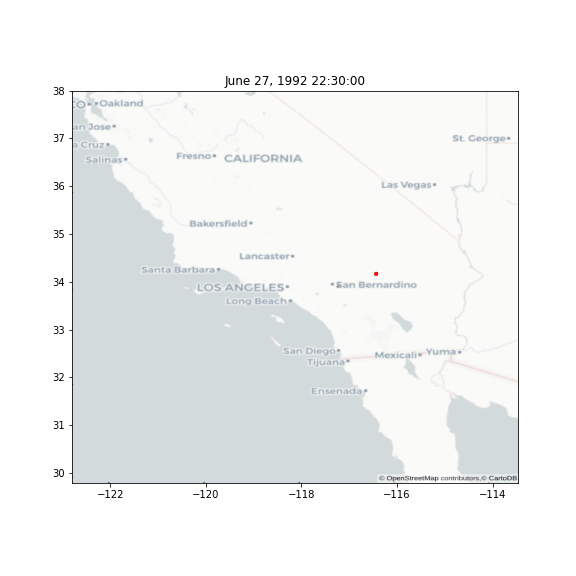

In [7]:
import IPython as ip

# with these parameters we can see 28 June 1992 earthquake in detail 
gif_maker(df,datetime.datetime(1992, 6, 27, 20, 0),70,1800,35000,50000,'June_1992_detailed_earthquake.gif')
ip.display.Image('June_1992_detailed_earthquake.gif')

# with these parameters we can see 22 April 1992 foreshocks  
#gif_maker(df,datetime.datetime(1992, 4, 13, 20, 0),60,40000,35000,40000,'April_1992_foreshocks.gif')
#ip.display.Image('April_1992_foreshocks.gif')

# with these parameters we can see 28 June 1992 earthquake on a larger time scale
#gif_maker(df,datetime.datetime(1992, 6, 20, 0, 0),70,42000,35000,51000,'June_1992_earthquake.gif')
#ip.display.Image('June_1992_earthquake.gif')